In [6]:
import torch
import whisper
from datasets import load_dataset

device = "cuda" if torch.cuda.is_available() else "cpu"

model = whisper.load_model("large-v2")
model.to(device)

# define the decoding options
options = whisper.DecodingOptions(language="de", without_timestamps=True, fp16=False)

# load an audio sample from LS val-clean (dataset is ~9MB total)
ds = load_dataset('i4ds/sds-stt-spc-train-fold_0', split='train')



In [13]:
audio = ds[0]["audio"]["array"]

In [17]:
len(audio)

480000

In [9]:

def inference(audio):
    audio = whisper.pad_or_trim(audio.flatten())
    mel = whisper.log_mel_spectrogram(audio)
    results = model.decode(mel, options)
    return results.text


In [46]:
from pydub import AudioSegment, effects

In [62]:
sound = AudioSegment.from_file("STT.mp3")


In [66]:
sound

In [67]:
effects.normalize(sound)

In [65]:
test

array('h', [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [57]:
test

array('h', [-2, -6, -8, -3, 5, 12, 13, 11, 11, 9, 7, 7, 5, 5, 11, 17, 20, 21, 22, 24, 27, 30, 32, 27, 14, 7, 6, 9, 11, 7, 2, 7, 20, 34, 37, 24, 9, -1, -9, -16, -23, -26, -19, -3, 14, 30, 43, 54, 61, 57, 45, 34, 25, 17, 9, 0, -8, -12, -13, -13, -12, -12, -13, -19, -23, -19, -9, -3, -5, -14, -15, -3, 14, 21, 14, 6, 6, 9, 9, -2, -21, -37, -45, -49, -53, -56, -59, -64, -72, -84, -87, -83, -80, -78, -77, -72, -61, -51, -45, -41, -44, -52, -59, -66, -67, -55, -42, -43, -58, -69, -62, -45, -41, -52, -64, -69, -60, -41, -28, -25, -27, -28, -28, -30, -27, -20, -16, -22, -31, -33, -28, -20, -16, -17, -22, -20, -15, -16, -21, -18, -10, -7, -10, -11, -3, 7, 6, -2, -9, -12, -6, 0, -10, -25, -31, -23, -5, 8, 2, -9, -12, -15, -20, -27, -31, -31, -42, -52, -38, -17, -10, -8, -1, 9, 21, 32, 45, 50, 42, 45, 59, 58, 48, 59, 82, 91, 78, 56, 42, 40, 48, 52, 38, 18, 15, 28, 45, 58, 69, 67, 52, 46, 53, 49, 37, 38, 44, 42, 44, 50, 50, 34, 12, 14, 22, 3, -16, -7, 2, -2, -7, -19, -29, -34, -36, -35, -45, -66, -

In [52]:
np.array(effects.normalize(sound))

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 31 dimensions. The detected shape was (98049, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1) + inhomogeneous part.

In [34]:
import librosa

def load_mp3_to_numpy(filename):
    """ Load an MP3 file into a NumPy array. """
    # Load the audio file as a waveform `y` and sampling rate `sr`
    y, sr = librosa.load(filename, sr=None)  # `sr=None` to preserve the original sampling rate
    return y, sr

# Example usage
audio_array, sampling_rate = load_mp3_to_numpy("SDS.mp3")

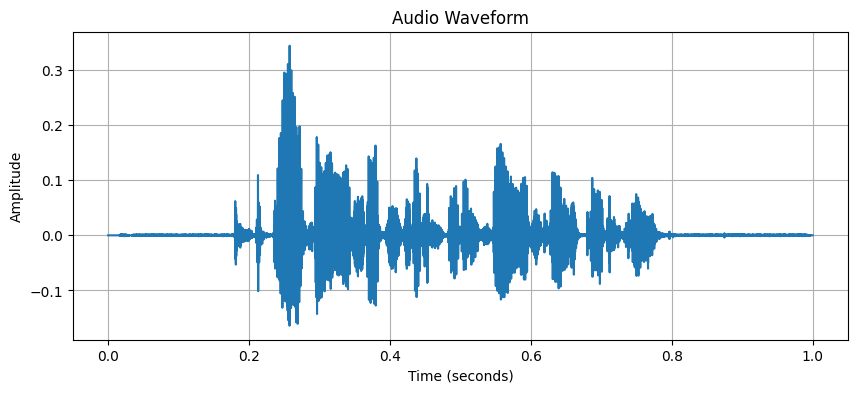

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Simulating an audio signal as a numpy array (replace with your audio data)
# For example, a simple sine wave
t = np.linspace(0, 1, len(audio_array))  # 1 second at 44100 Hz

# Plotting the audio wave
plt.figure(figsize=(10, 4))
plt.plot(t, audio_array)
plt.title('Audio Waveform')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

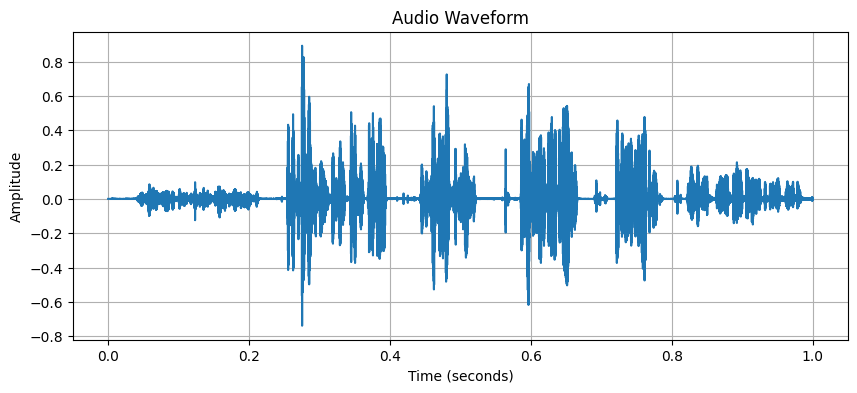

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Simulating an audio signal as a numpy array (replace with your audio data)
# For example, a simple sine wave
t = np.linspace(0, 1, len(audio))  # 1 second at 44100 Hz

# Plotting the audio wave
plt.figure(figsize=(10, 4))
plt.plot(t, audio)
plt.title('Audio Waveform')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

In [20]:
import IPython.display as ipd
ipd.Audio(audio, rate=16000)  

In [10]:
unscaled_transcription = inference(audio)

RuntimeError: expected m1 and m2 to have the same dtype, but got: float != double

In [ ]:

# Rescale audio to [-1, 1] and then to zero mean
audio_scaled = ((audio - audio.min()) / (audio.max() - audio.min())) * (2) - 1  
audio_scaled = audio_scaled - audio_scaled.mean()

scaled_transcription = inference(audio_scaled)

print("Target:   ", ds[0]["text"])
print("Unscaled: ", unscaled_transcription)
print("Scaled:   ", scaled_transcription)